## Smoking and Drinking Dataset with body signal

### Подключение модулей

In [1]:
# импортируем необходимые модули
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix
import xgboost as xgb

from sklearn.model_selection import cross_val_score, GridSearchCV, learning_curve
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, RocCurveDisplay, precision_score, recall_score, f1_score

### Загрузка данных

In [2]:
# загружаем данные из файла в формате CSV и сохраняем в дата-фрейм (переменную df)
df = pd.read_csv('smoking_driking_dataset_Ver01.csv')

In [3]:
df.head(20)

,sex,age,height,weight,waistline,sight_left,sight_right,hear_left,hear_right,SBP,...,LDL_chole,triglyceride,hemoglobin,urine_protein,serum_creatinine,SGOT_AST,SGOT_ALT,gamma_GTP,SMK_stat_type_cd,DRK_YN
0,Male,35,170,75,90.0,1.0,1.0,1.0,1.0,120.0,...,126.0,92.0,17.1,1.0,1.0,21.0,35.0,40.0,1.0,Y
1,Male,30,180,80,89.0,0.9,1.2,1.0,1.0,130.0,...,148.0,121.0,15.8,1.0,0.9,20.0,36.0,27.0,3.0,N
2,Male,40,165,75,91.0,1.2,1.5,1.0,1.0,120.0,...,74.0,104.0,15.8,1.0,0.9,47.0,32.0,68.0,1.0,N
3,Male,50,175,80,91.0,1.5,1.2,1.0,1.0,145.0,...,104.0,106.0,17.6,1.0,1.1,29.0,34.0,18.0,1.0,N
4,Male,50,165,60,80.0,1.0,1.2,1.0,1.0,138.0,...,117.0,104.0,13.8,1.0,0.8,19.0,12.0,25.0,1.0,N
5,Male,50,165,55,75.0,1.2,1.5,1.0,1.0,142.0,...,95.0,232.0,13.8,3.0,0.8,29.0,40.0,37.0,3.0,Y
6,Female,45,150,55,69.0,0.5,0.4,1.0,1.0,101.0,...,115.0,75.0,12.3,1.0,0.8,19.0,12.0,12.0,1.0,N
7,Male,35,175,65,84.2,1.2,1.0,1.0,1.0,132.0,...,107.0,101.0,14.4,1.0,0.8,18.0,18.0,35.0,3.0,Y
8,Male,55,170,75,84.0,1.2,0.9,1.0,1.0,145.0,...,141.0,100.0,15.1,1.0,0.8,32.0,23.0,26.0,1.0,Y
9,Male,40,175,75,82.0,1.5,1.5,1.0,1.0,132.0,...,118.0,83.0,13.9,1.0,0.9,21.0,38.0,16.0,2.0,Y


#### Описание данных

Sex - пол мужской, женский

Age - округленно до 5 лет

Height - округленно до 5 см[см]

Weight [kg] - Вес [кг]

Waistline - Талия

Sight_left - левый глаз, насколько хорошо видит глаз, где идеальное зрение = 1,0

Sight_right - правый глаз, насколько хорошо видит глаз, где идеальное зрение = 1,0

Hear_left - слух слева, 1 (нормальный), 2 (ненормальный)

Hear_right - слух справа, 1 (нормальный), 2 (ненормальный)

SBP - систолическое артериальное давление [мм рт.ст.]

DBP - диастолическое артериальное давление [мм рт.ст.]

BLDS - уровень глюкозы в крови натощак или ФСГ [мг/дл]

Tot_chole - общий холестерин [мг/дл]

HDL_chole - холестерин высокой плотности (HDL) [мг/дл] - единственная фракция холестерина, которую называют "хорошим","полезным" холестерином.

LDL_chole - холестерин низкой плотности (LDL) [мг/дл]

Triglyceride -  триглицериды [мг/дл]

Hemoglobin - гемоглобин [г/дл]

Urine_protein - белок в моче., 1(-), 2(+/-), 3(+1), 4(+2), 5(+3), 6(+4)

Serum_creatinine - уровень креатинина в крови [мг/дл]

SGOT_AST - уровень глутамат-оксалоацетаттрансферазы (Глутамат-оксалоацетаттрансферазы) и АСТ(аспартаттрансферазы)[МЕ/л]

SGOT_ALT - АЛТ(аланиновая трансаминаза)[МЕ/л]

Gamma_GTP - y-глутамилтранспептидаза[МЕ/л]

SMK_stat_type_cd - Состояние курильщика, 1(никогда не курил), 2(раньше курил, но бросил), 3 (все еще курю)

DRK_YN - Пьющий или нет (Y-Да/N-Нет)

Вывели информацию о датасете

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 991346 entries, 0 to 991345
Data columns (total 24 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   sex               991346 non-null  object 
 1   age               991346 non-null  int64  
 2   height            991346 non-null  int64  
 3   weight            991346 non-null  int64  
 4   waistline         991346 non-null  float64
 5   sight_left        991346 non-null  float64
 6   sight_right       991346 non-null  float64
 7   hear_left         991346 non-null  float64
 8   hear_right        991346 non-null  float64
 9   SBP               991346 non-null  float64
 10  DBP               991346 non-null  float64
 11  BLDS              991346 non-null  float64
 12  tot_chole         991346 non-null  float64
 13  HDL_chole         991346 non-null  float64
 14  LDL_chole         991346 non-null  float64
 15  triglyceride      991346 non-null  float64
 16  hemoglobin        99

Посмотрели что пустых значей нет

In [5]:
df.isnull().sum()

sex                 0
age                 0
height              0
weight              0
waistline           0
sight_left          0
sight_right         0
hear_left           0
hear_right          0
SBP                 0
DBP                 0
BLDS                0
tot_chole           0
HDL_chole           0
LDL_chole           0
triglyceride        0
hemoglobin          0
urine_protein       0
serum_creatinine    0
SGOT_AST            0
SGOT_ALT            0
gamma_GTP           0
SMK_stat_type_cd    0
DRK_YN              0
dtype: int64

Вывели название столбцов

In [6]:
df.columns

Index(['sex', 'age', 'height', 'weight', 'waistline', 'sight_left',
       'sight_right', 'hear_left', 'hear_right', 'SBP', 'DBP', 'BLDS',
       'tot_chole', 'HDL_chole', 'LDL_chole', 'triglyceride', 'hemoglobin',
       'urine_protein', 'serum_creatinine', 'SGOT_AST', 'SGOT_ALT',
       'gamma_GTP', 'SMK_stat_type_cd', 'DRK_YN'],
      dtype='object')

Закодировали поля sex и DRK_YN в бинарные 1 и 0

sex - Male - 1 Female - 0

DRK_YN - Y - 1 N - 0

In [7]:
df["sex"] = df["sex"].apply(lambda x: 1 if x == 'Male' else 0)
df["DRK_YN"] = df["DRK_YN"].apply(lambda x: 1 if x == 'Y' else 0)

Проверели тип данных измененных данных 

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 991346 entries, 0 to 991345
Data columns (total 24 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   sex               991346 non-null  int64  
 1   age               991346 non-null  int64  
 2   height            991346 non-null  int64  
 3   weight            991346 non-null  int64  
 4   waistline         991346 non-null  float64
 5   sight_left        991346 non-null  float64
 6   sight_right       991346 non-null  float64
 7   hear_left         991346 non-null  float64
 8   hear_right        991346 non-null  float64
 9   SBP               991346 non-null  float64
 10  DBP               991346 non-null  float64
 11  BLDS              991346 non-null  float64
 12  tot_chole         991346 non-null  float64
 13  HDL_chole         991346 non-null  float64
 14  LDL_chole         991346 non-null  float64
 15  triglyceride      991346 non-null  float64
 16  hemoglobin        99

Вывели описание, видим анамалии в столбцах: waistline, LDL_chole, triglyceride, SGOT_AST, gamma_GTP, в остальных столбцах анамальных значений нет.

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
sex,991346.0,0.531010,0.499038,0.0,0.0,1.0,1.0,1.0
age,991346.0,47.614491,14.181339,20.0,35.0,45.0,60.0,85.0
height,991346.0,162.240625,9.282957,130.0,155.0,160.0,170.0,190.0
weight,991346.0,63.284050,12.514241,25.0,55.0,60.0,70.0,140.0
waistline,991346.0,81.233358,11.850323,8.0,74.1,81.0,87.8,999.0
sight_left,991346.0,0.980834,0.605949,0.1,0.7,1.0,1.2,9.9
sight_right,991346.0,0.978429,0.604774,0.1,0.7,1.0,1.2,9.9
hear_left,991346.0,1.031495,0.174650,1.0,1.0,1.0,1.0,2.0
hear_right,991346.0,1.030476,0.171892,1.0,1.0,1.0,1.0,2.0
SBP,991346.0,122.432498,14.543148,67.0,112.0,120.0,131.0,273.0


Удалил строки с аномальными значениями

In [10]:
df = df[df['waistline'] < 150].copy()
df = df[df['HDL_chole'] < 800].copy()
df = df[df['LDL_chole'] < 800].copy()
df = df[df['triglyceride'] < 800].copy()
df = df[df['SGOT_AST'] < 60].copy()
df = df[df['SGOT_ALT'] < 65].copy()
df = df[df['gamma_GTP'] < 150].copy()

Вывели новый размер датасета

Убедимся что аномальных значей не осталось

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
sex,927829.0,0.512451,0.499845,0.0,0.0,1.0,1.0,1.0
age,927829.0,47.730546,14.273110,20.0,40.0,50.0,60.0,85.0
height,927829.0,161.981766,9.267950,130.0,155.0,160.0,170.0,190.0
weight,927829.0,62.646134,12.125502,25.0,55.0,60.0,70.0,140.0
waistline,927829.0,80.707688,9.418840,27.0,74.0,81.0,87.0,149.1
sight_left,927829.0,0.978800,0.606095,0.1,0.7,1.0,1.2,9.9
sight_right,927829.0,0.976234,0.604723,0.1,0.7,1.0,1.2,9.9
hear_left,927829.0,1.031753,0.175341,1.0,1.0,1.0,1.0,2.0
hear_right,927829.0,1.030714,0.172541,1.0,1.0,1.0,1.0,2.0
SBP,927829.0,122.051767,14.474178,67.0,111.0,120.0,130.0,273.0


In [12]:
df.shape

(927829, 24)

Посмотрели соотношение мужчин - 1 и женщин в датасете - 0, почти одинаково

<Axes: xlabel='sex'>

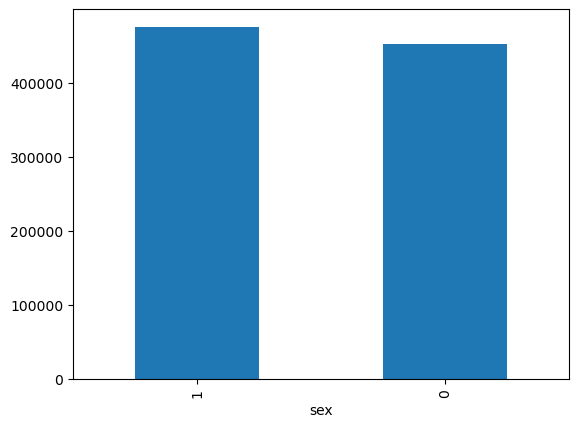

In [13]:
df['sex'].value_counts(normalize=False).plot.bar()

Проверим нормальность распределения

Нормальное распределение только у столбца рост

Почти нормальное у столбца вес,SGOT_AST и gamma_GTR

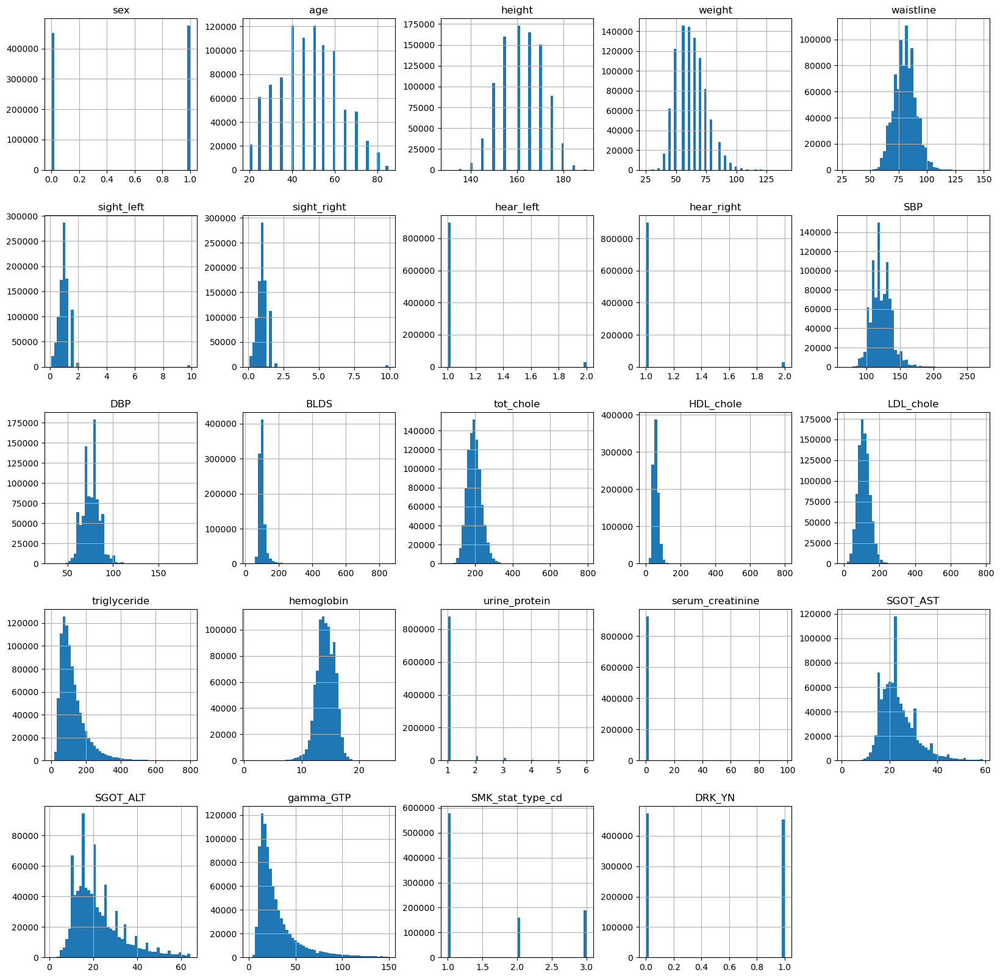

In [14]:
df.hist(figsize=(20,20),bins=50);

Построили круговую диаграмму на основе стотлбца SMK_stat_type_cd

1 - Не курил

2 - Бросил курить

3 - Курит

<Axes: ylabel='proportion'>

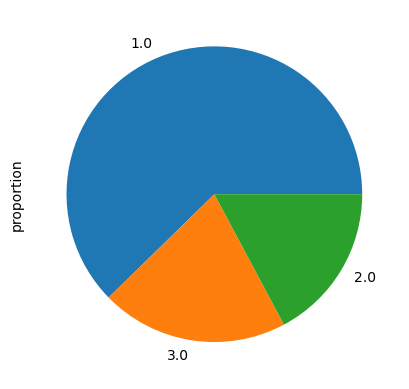

In [15]:
df['SMK_stat_type_cd'].value_counts(normalize=True).plot.pie()

Вывели количество значений каждого класса

In [16]:
df['SMK_stat_type_cd'].value_counts()

SMK_stat_type_cd
1.0    578202
3.0    190063
2.0    159564
Name: count, dtype: int64

CPU times: total: 3min 16s
Wall time: 3min 17s


C:\Users\Denis\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


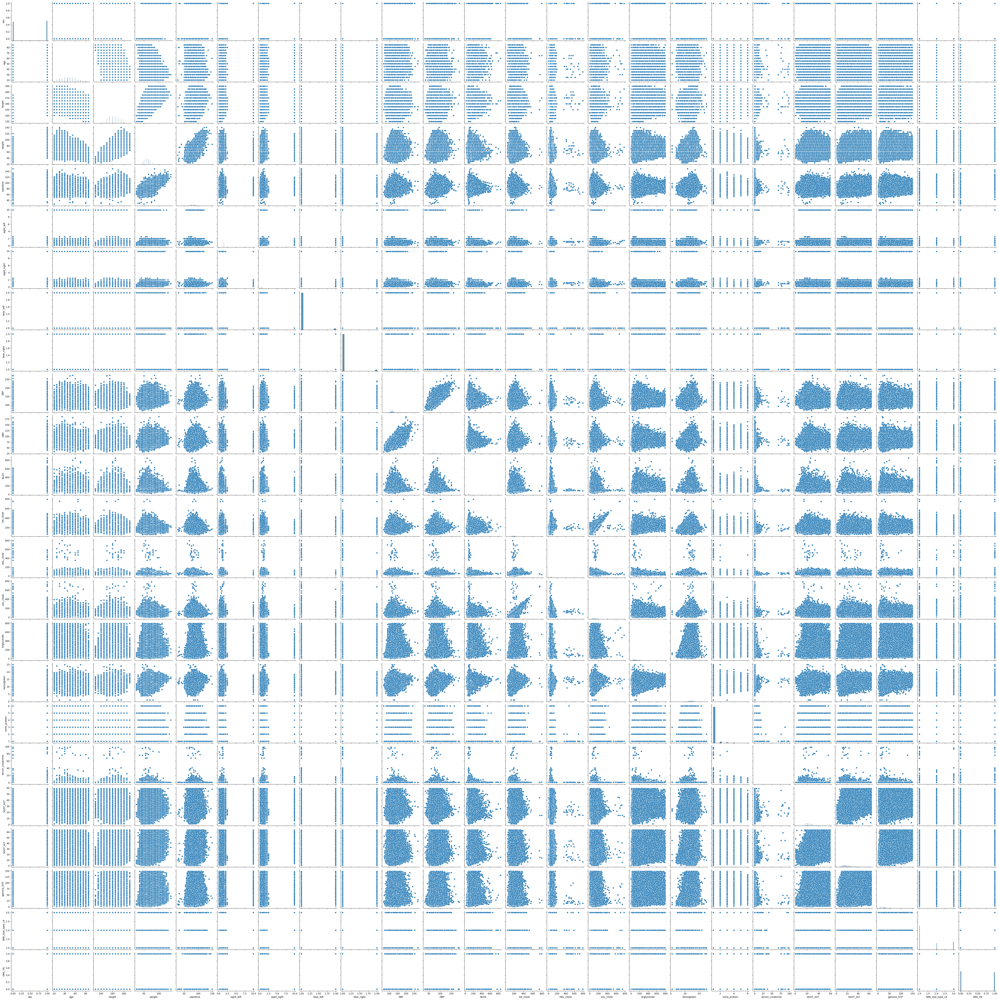

In [17]:
%%time
sns.pairplot(df)

Вывели тепловую карту. Высокая корреляция замечена среди столбцов: 

sex - height, hemoglobin

height - weight

weight - waistline

SBR - DBP

tot_chole - LDL_chole

SGOT_AST - SGOT_ALT

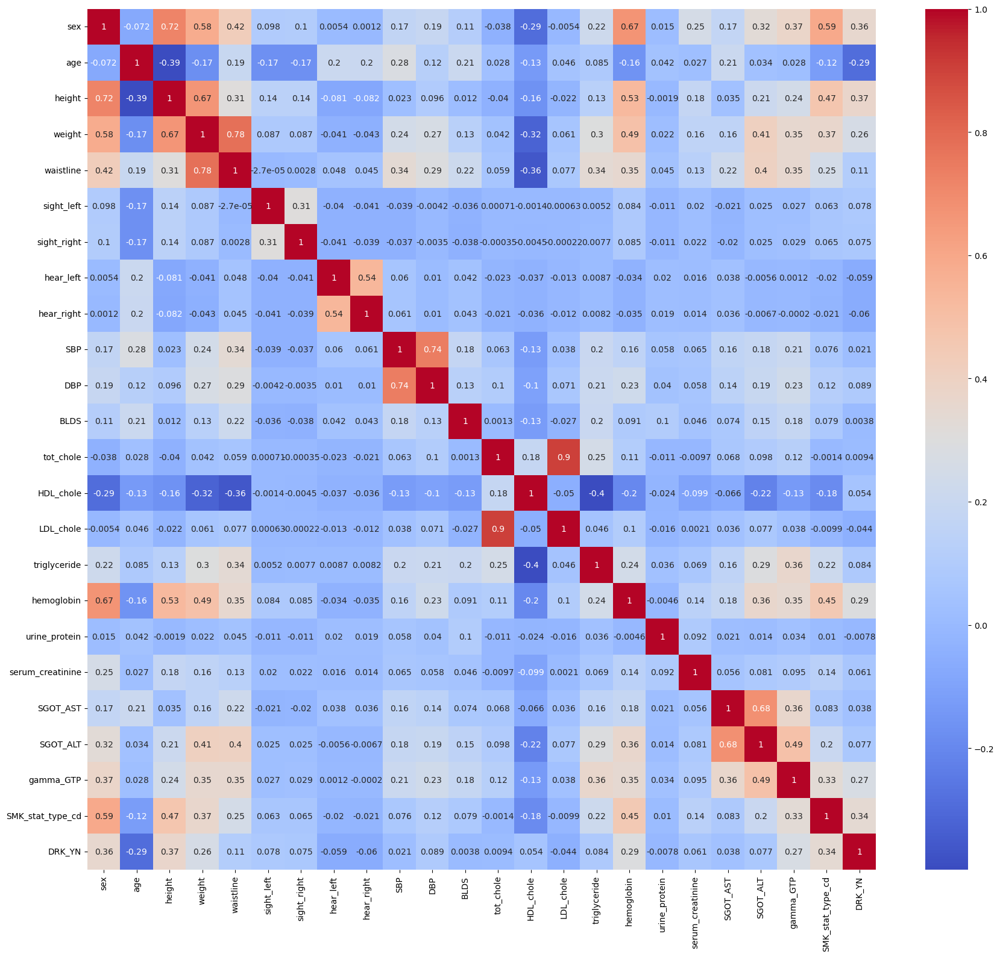

In [18]:
correlation_matrix = df.corr()

plt.figure(figsize=(18, 16))

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2g')

plt.tight_layout()
plt.show()

### Modelling

In [19]:
code_map = {1.0: 0, 2.0: 1, 3.0:2}
df['SMK_stat_type_cd'] = df['SMK_stat_type_cd'].map(code_map)

Целевая переменная - SMK_stat_type_cd

In [20]:
X = df.copy()
del X['SMK_stat_type_cd']
y = df['SMK_stat_type_cd']
y

0         0
1         2
2         0
3         0
4         0
         ..
991341    0
991342    0
991343    2
991344    0
991345    2
Name: SMK_stat_type_cd, Length: 927829, dtype: int64

Раздаление данных на тренеровачные и тестовые

In [21]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42, stratify=y)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(621645, 23) (306184, 23) (621645,) (306184,)


### KNeighborsClassifier (Классификация ближайших соседей)

In [22]:
%%time
knn = KNeighborsClassifier()

X_train = X_train.to_numpy()
X_test = X_test.to_numpy()

knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)

CPU times: total: 15min 30s
Wall time: 2min 45s


In [23]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.73      0.86      0.79    190807
           1       0.34      0.26      0.30     52656
           2       0.45      0.28      0.35     62721

    accuracy                           0.64    306184
   macro avg       0.51      0.47      0.48    306184
weighted avg       0.60      0.64      0.61    306184



### Random Forest Classifier

In [24]:
%%time
rfc = RandomForestClassifier(random_state = 42)

rfc.fit(X_train, y_train)


rfc_pred_test = rfc.predict(X_test)

CPU times: total: 3min 38s
Wall time: 3min 39s


In [25]:
print(classification_report(y_test, rfc_pred_test))

              precision    recall  f1-score   support

           0       0.83      0.86      0.84    190807
           1       0.45      0.36      0.40     52656
           2       0.52      0.55      0.54     62721

    accuracy                           0.71    306184
   macro avg       0.60      0.59      0.59    306184
weighted avg       0.70      0.71      0.70    306184



XGBoost (eXtreme Gradient Boosting)

In [26]:
%%time

xgbc = xgb.XGBClassifier(random_state = 42)

xgbc.fit(X_train, y_train)

xgbc_pred_test = xgbc.predict(X_test)

CPU times: total: 51.5 s
Wall time: 5.68 s


In [27]:
print(classification_report(y_test, xgbc_pred_test))

              precision    recall  f1-score   support

           0       0.84      0.86      0.85    190807
           1       0.46      0.37      0.41     52656
           2       0.53      0.57      0.55     62721

    accuracy                           0.72    306184
   macro avg       0.61      0.60      0.60    306184
weighted avg       0.71      0.72      0.71    306184



Запомним метрики для будущего сравнения

In [28]:
xgbc_precision = precision_score(y_test, xgbc_pred_test, average='macro')

xgbc_recall = recall_score(y_test, xgbc_pred_test, average='macro')

xgbc_f1 = f1_score(y_test, xgbc_pred_test, average='macro')

Новый датафрейм для создания barh

In [29]:
knn_acc = accuracy_score(y_test, y_pred)
rfc_acc = accuracy_score(y_test, rfc_pred_test)
xgbc_acc = accuracy_score(y_test, xgbc_pred_test)

df_accuracy = pd.DataFrame({'name': ['KNeighborsClassifier','Random Forest Classifier','XGBoost'], 'score': [knn_acc,rfc_acc,xgbc_acc]})
df_accuracy.sort_values('score', inplace=True)
df_accuracy

,name,score
0,KNeighborsClassifier,0.641657
1,Random Forest Classifier,0.709103
2,XGBoost,0.715638


Вывели график, наблюдаем что XGBoost самая лучшая модель, поэтому будем использовать её для настроки гиперпараметров

<BarContainer object of 3 artists>

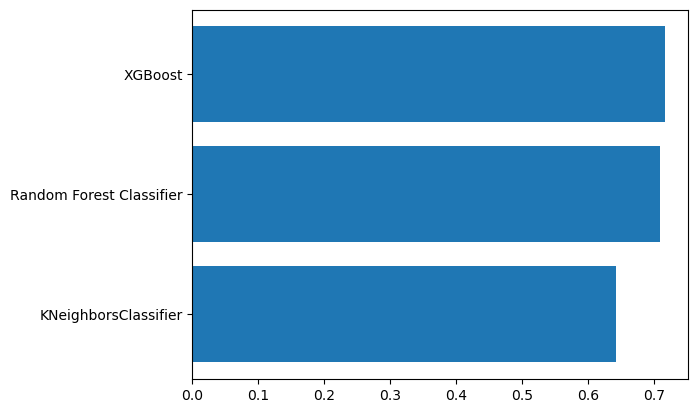

In [30]:
plt.barh(df_accuracy['name'], df_accuracy['score'])

### Настройка гиперпараметров

Для настроки гиперпараметров используеться XGBoost, так как у этой модели самые лучшие значения по f1-score.

In [31]:
%%time
# Hyperparameter tuning
param_grid = {'n_estimators': [100, 150, 200], 'max_depth': [1,5,10,25]}

xgbc1 = xgb.XGBClassifier(random_state = 42)

grid_search = GridSearchCV(estimator=xgbc1, param_grid=param_grid, cv=5)
grid_search.fit(X_train, y_train)
print("Best Parameters: ", grid_search.best_params_)

Best Parameters:  {'max_depth': 5, 'n_estimators': 100}
CPU times: total: 3h 17min 45s
Wall time: 30min 54s


Нашли что модель с 100 деревьями и глубиной 5 самая лучшая.

Обучаем модель c новыми параметрами

In [33]:
xgbc1 = xgb.XGBClassifier(random_state = 42, n_estimators = 50, max_depth = 5)
xgbc1.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=50, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [34]:
xgbc1_pred_test = xgbc1.predict(X_test)

print(classification_report(y_test, xgbc1_pred_test))

              precision    recall  f1-score   support

           0       0.84      0.86      0.85    190807
           1       0.46      0.37      0.41     52656
           2       0.53      0.57      0.55     62721

    accuracy                           0.72    306184
   macro avg       0.61      0.60      0.60    306184
weighted avg       0.71      0.72      0.71    306184



Сохраним данные для сравнения

In [35]:
xgbc1_precision = precision_score(y_test, xgbc1_pred_test, average='macro')
xgbc1_recall = recall_score(y_test, xgbc1_pred_test, average='macro')
xgbc1_f1 = f1_score(y_test, xgbc1_pred_test, average='macro')

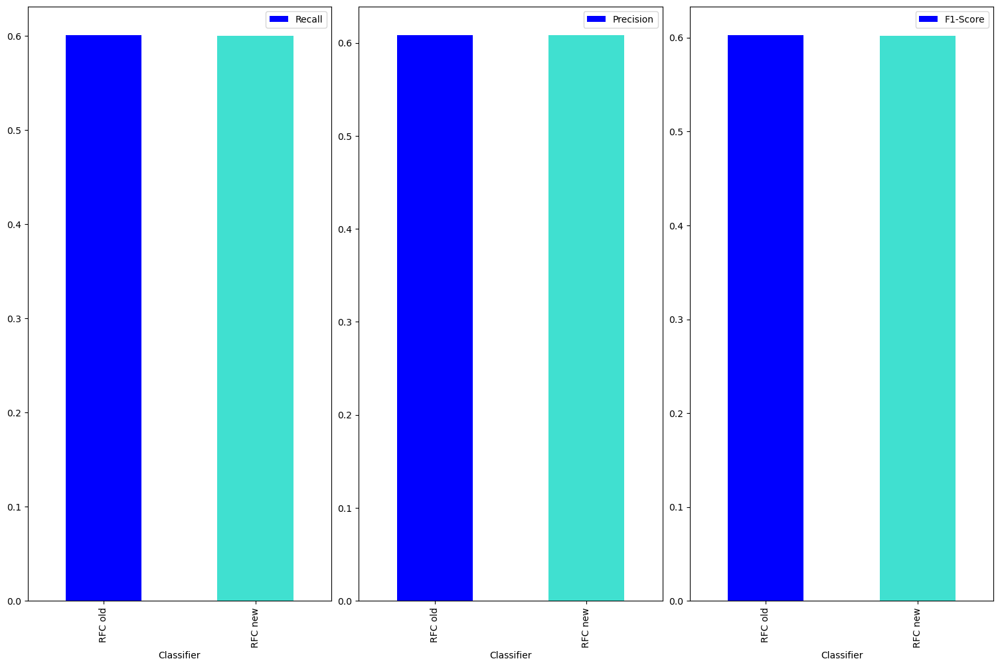

In [36]:
classifiers =["RFC old", "RFC new"]
log_cols = ["Recall", "Precision", "F1-Score"]
log = pd.DataFrame(columns=log_cols)

log["Classifier"] = classifiers
log.set_index('Classifier', inplace=True)

log["Recall"] = [xgbc_recall, xgbc1_recall]
log['Precision'] = [xgbc_precision, xgbc1_precision]
log["F1-Score"] = [xgbc_f1, xgbc1_f1]

fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(15,10))
index = 0
ax = ax.flatten()

for col, value in log.items():
    log[col].plot.bar(ax=ax[index], legend=True, color=['blue','turquoise'])
    index += 1
    
plt.tight_layout(pad=0.5, w_pad=0.7, h_pad=5.0)

### Вывод

Самая лучшая модел это XGBoost, но она не так хорошо спровляеться со 2 и 3 классом.

Модель с 100 деревьями и глубиной 5 самая лучшая выявленная с помощью GridSearchCV, но улучшений небыло замечено.

Данный датасет не сбалансированный.

Пустых значеный не наблюдалось, но были выбросы которые были устранены.

Высокая корреляция заметна в основном у составных медецинских паказателей.